**Nama :** Tuhu Pangestu   
**NIM :** 230411100096  
**Matakuliah :** Pengolahan Citra

# Tugas 2

Implementasi Representasi Citra (bab2) dan Operasi Dasar Citra (bab3). Setiap mahasiswa mengirimkan file code Phyton & hasil running image (foto stiap mhs).hasil running berupa screenshot dikumpulkan dlm 1 file pdf, diserahkan di GCR maksimal H-1 pertemuan ke 4 (8Sept2025).
1. Utk bab 2, berikan representasi citra dari foto kalian masing-masing.
2. Utk bab 3, setiap mhs melakukan implemntasi 5 jenis operasi dasar citra (bebas memilih sesuai materi file bab 3). Kemudian setiap mahasiswa menganalisis hasil operasi dasar citra yang diimplementasikn tsb.

# 1. Representasi Citra

## Model Citra

### Deskripsi Intensitas Piksel

- Intensitas pada sebuah piksel citra merupakan kombinasi dari komponen warnanya:  
  $f_{merah}(x,y)$, $f_{hijau}(x,y)$, dan $f_{biru}(x,y)$.



<img src="tuhu.jpg" alt="gambar" width="200"/>


## **Digitalisasi Citra**

Agar dapat diolah dengan komputer digital CItra harus direpresentasikan secara numerik dengan nilai-nilai diskrit.  
  
Citra digital yang tingginya N, lebarnya M, dan memiliki L derajat keabuan dapat dianggap sebagai fungsi : 
$$
f(x,y), \quad 
\begin{cases} 
0 \leq x \leq M \\
0 \leq y \leq N \\
0 \leq f \leq L 
\end{cases}
$$

Keterangan : 
   
$ N = Tinggi $  
$ M = Lebar  $  
$ L = Derajat Keabuan $

Citra digital yang berukuran N x M lazim dinyatakan dengan matriks yang berukuran N baris dan M kolom sebagai berikut :

Import Library

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
image = cv2.imread('tuhu.jpg',0) 
N , M = image.shape
print("ukuran gambar :", N,"x", M)

ukuran gambar : 1080 x 1080


Ukuran gambar saya sangat besar, jadi untuk percobaan saya akan mengecilkan gambar terlebih dahulu.

In [27]:
image = cv2.imread('tuhu.jpg',0)
resize_image = cv2.resize(image, (10, 10))
N , M = resize_image.shape
print("ukuran gambar setelah di resize :", N,"x", M)

ukuran gambar setelah di resize : 10 x 10


**Matriks untuk citra satu kanal**

In [28]:
print(image)

[[ 50  51  51 ... 234 138  18]
 [ 45  47  48 ... 243 172  55]
 [ 41  43  46 ... 237 205 101]
 ...
 [  4   7   6 ...  10   8   4]
 [  5   7   6 ...   8   9   7]
 [  5   7   6 ...   5   8   9]]


**Matriks untuk citra spektral**

In [ ]:
image = cv2.imread('tuhu.jpg',1) 
resize_image = cv2.resize(image, (10, 10))
image = resize_image
N , M , C = image.shape
print("ukuran gambar :", N,"x", M,"x", C)


print(image)

ukuran gambar : 10 x 10 x 3
[[[244 132   5]
  [233 124   1]
  [212  53   1]
  [206  49   2]
  [149 194 221]
  [189 253 254]
  [ 70  90 108]
  [ 37  31  32]
  [ 77  96 106]
  [138 194 218]]

 [[144 123 172]
  [ 68  44  38]
  [243  83   3]
  [246  73   1]
  [138 202 231]
  [166 207 221]
  [106 137 164]
  [ 34  29  30]
  [ 86 114 126]
  [167 219 241]]

 [[245 227 220]
  [226 194 155]
  [ 27 130 140]
  [255  91   2]
  [ 20  64  92]
  [  9  11  23]
  [115 184 211]
  [ 23  18  19]
  [ 10  23  40]
  [ 88 117 132]]

 [[ 87  88  86]
  [107 234 250]
  [253 195 162]
  [252 135   2]
  [  3   1   1]
  [ 36  71 118]
  [  0   0   2]
  [ 20  17  17]
  [ 79 128 155]
  [  8  11  10]]

 [[220 252 253]
  [ 78  63  38]
  [110  91   6]
  [244 195 121]
  [ 20  38  46]
  [ 80 115 188]
  [ 88 120 183]
  [ 10  10  10]
  [  1   2   3]
  [  2   2   2]]

 [[144 108 143]
  [182 199 190]
  [137  78  19]
  [ 64  72  66]
  [120 138 140]
  [ 55  93 148]
  [227 218 232]
  [  4   2   3]
  [  2   4   4]
  [  0   3  12]]



# 2. implemntasi operasi-operasi dasar citra

## Aras Komputasi
Operasi-operasi yang dilakukan pada pengolahan citra dapat dikelompokan ke dalam empas aras(level) komputasi, yaitu aras titik, aras lokal, aras global dan aras objek. Kita mulai pembahasan komputasi pada aras titik : 

**1. Aras Titik**  
  
Operasi pada aras titik hanya dilakukan pada pixel tunggal di dalam citra. Operasi ini dikenal juga dengan nama *operasi pointwise*. Operasi ini terdiri dari pengaksesan pixel pada lokasi yang diberikan, memodifikasinya dengan operasi lanjar (*linear*) atau nirlanjar (*nonlinear*), dan menempatkan nilai pixel baru pada lokasi yang bersesuaian di dalam citra yang baru. Operasi ini diulangi untuk keseluruhan pixel di dalam citra.

Secara matematis, operasi pada aras titik dinyatakan sebagai:
$$
f_B(x, y) = O_{titik}\{f_A(x, y)\}
$$

Di sini, $f_A$ dan $f_B$ masing-masing adalah citra masukan dan citra keluaran, sedangkan $O_{titik}$ dapat berupa operasi lanjar (*linear*) atau nirlanjar (*nonlinear*).
Yang dimaksud dengan operasi lanjar adalah operasi yang dapat dinyatakan secara matematis sebagai persamaan lanjar, sedangkan kebalikannya adalah persamaan nirlanjar.


**a. Berdasarkan Intensitas**  
Nilai intensitas $f(x, y)$ suatu pixel diubah dengan transformasi $h$ menjadi nilai intensitas baru $v$:
$$
v = h(f(x, y))
$$

Contoh operasi titik berdasarkan intensitas adalah operasi pengambangan (*thresholding*). Pada operasi pengambangan, nilai intensitas pixel $f(x, y)$ dipetakan ke salah satu dari dua nilai, $a_1$ atau $a_2$, berdasarkan nilai ambang (*threshold*) $T$:
$$
v = \begin{cases} a_1, & \text{jika } f(x, y) < T \\ a_2, & \text{jika } f(x, y) \geq T \end{cases}
$$

Jika $a_1 = 0$ dan $a_2 = 1$, maka operasi pengambangan mentransformasikan citra hitam-putih ke citra biner. Dengan kata lain, nilai intensitas pixel semula dipetakan ke dua nilai saja: hitam dan putih.
Nilai ambang yang dipakai dapat berlaku untuk keseluruhan pixel atau untuk wilayah tertentu saja (berdasarkan penyebaran nilai intensitas pada wilayah tersebut).

Berikut adalah contoh operasi pengambangan pada citra dengan fungsi transformasi menghasilkan citra biner seperti berikut:

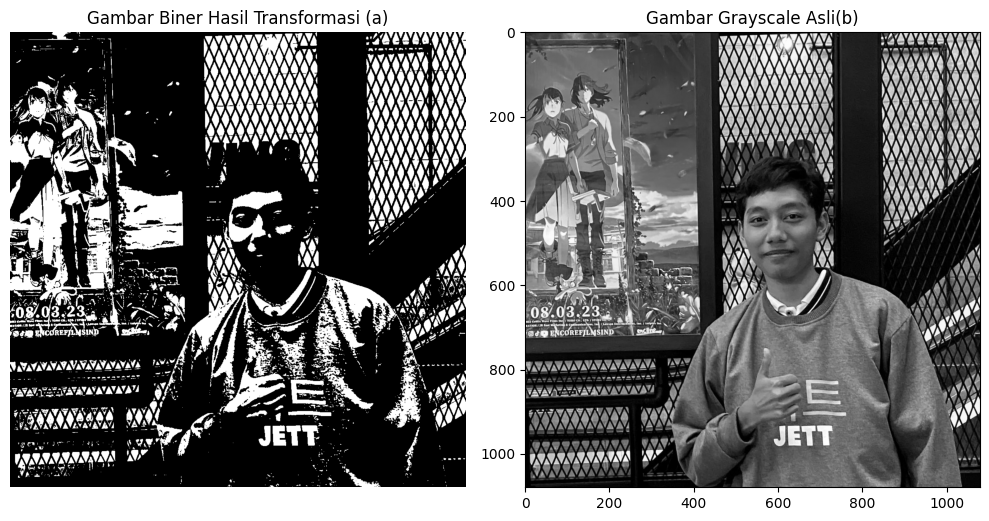

In [ ]:
# membaca gambar
file_path = 'tuhu.jpg'
original_image = cv2.imread(file_path)
original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# konversi ke grayscale
gray_image = cv2.cvtColor(original_image_rgb, cv2.COLOR_RGB2GRAY)

# Menerapkan fungsi transformasi (Tresholding)
# jika f(x,y) < 128, nilai baru = 0 (hitam)
# jika f(x,y) >= 128, nilai baru = 255 (putih)
treshold_value = 128
max_value = 255

ret, binary_image = cv2.threshold(gray_image, treshold_value, max_value, cv2.THRESH_BINARY)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(binary_image, cmap='gray')
axes[0].set_title('Gambar Biner Hasil Transformasi (a)')
axes[0].axis('off')

axes[1].imshow(gray_image, cmap='gray')
axes[1].set_title('Gambar Grayscale Asli(b)')
axes[1].axis('on')

plt.tight_layout()
plt.show()


### (i) Operasi Negatif  
Operasi negatif digunakan untuk menghasilkan citra negatif (*negative image*), mirip dengan efek film negatif pada fotografi. Prinsipnya adalah membalik nilai intensitas setiap piksel terhadap nilai maksimum derajat keabuan.  

- Untuk citra dengan kedalaman 8 bit (nilai maksimum 255), transformasi negatif dirumuskan sebagai:  
$$
f'(x, y) = 255 - f(x, y)
$$  

- Untuk citra dengan 128 tingkat keabuan (nilai maksimum 127), transformasinya menjadi:  
$$
f'(x, y) = 127 - f(x, y)
$$  

Dengan transformasi ini, bagian yang semula terang akan berubah menjadi gelap, sedangkan bagian yang gelap akan berubah menjadi terang.  

Contoh:  
- Piksel dengan nilai keabuan **30 (gelap)** → setelah operasi negatif menjadi **225 (sangat terang)** pada citra 8 bit.  
- Piksel dengan nilai **200 (terang)** → berubah menjadi **55 (gelap)**.  

Hasil akhirnya membuat citra terlihat seperti versi kebalikan dari citra asli.  


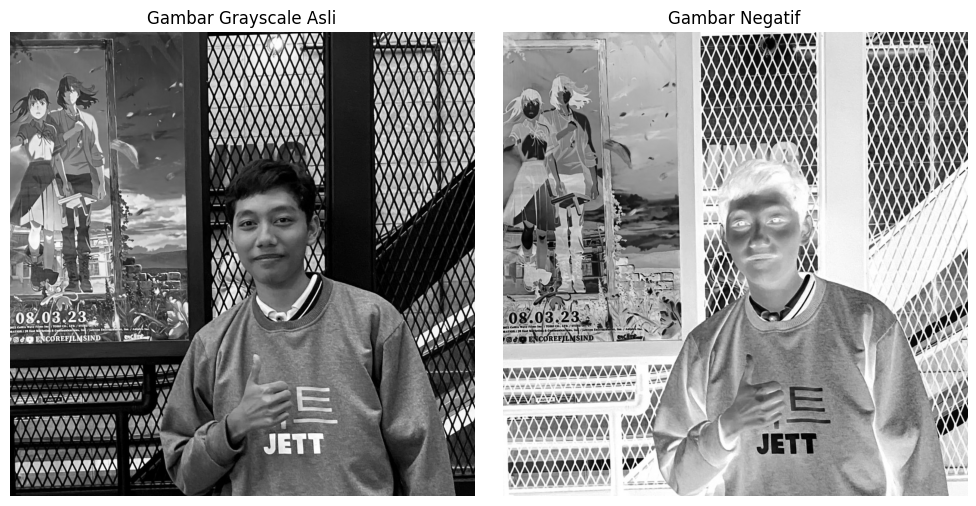

In [31]:
# Operasi Negatif pada citra grayscale
negative_image = max_value - gray_image

# Visualisasi hasil
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title('Gambar Grayscale Asli')
axes[0].axis('off')

axes[1].imshow(negative_image, cmap='gray')
axes[1].set_title('Gambar Negatif')
axes[1].axis('off')

plt.tight_layout()
plt.show()

**(ii) Pemotongan (Clipping)**

Operasi ini dilakukan jika nilai intensitas pixel hasil suatu operasi pengolahan citra terletak di bawah nilai intensitas minimum atau di atas nilai intensitas maksimum. Nilai pixel yang melebihi batas akan dipotong (clipped) ke nilai minimum atau maksimum yang diizinkan.

Rumus pemotongan (clipping) untuk citra 8 bit (0-255) adalah:
$$
f'(x, y) = \begin{cases}
255, & f(x, y) > 255 \\
f(x, y), & 0 \leq f(x, y) \leq 255 \\
0, & f(x, y) < 0
\end{cases}
$$

Pemotongan (clipping) termasuk ke dalam operasi pengambangan juga.

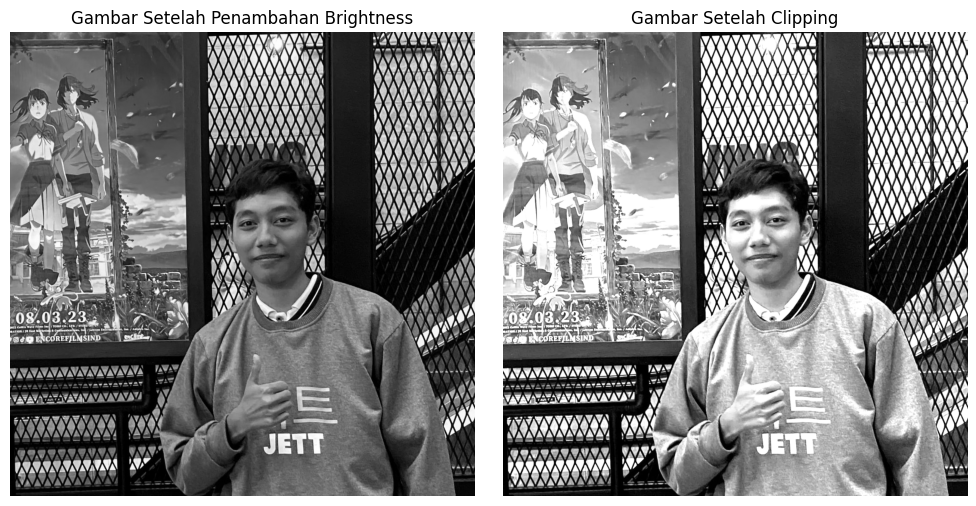

In [32]:
import numpy as np

# Operasi pemotongan (clipping) pada citra grayscale

# Misal kita ingin menambahkan nilai brightness yang besar ke gray_image
brightness = 100
brightened_image = gray_image.astype(np.int16) + brightness

# Lakukan clipping agar nilai tetap di rentang [0, 255]
clipped_image = np.clip(brightened_image, 0, max_value).astype(np.uint8)

# Visualisasi hasil
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(brightened_image, cmap='gray')
axes[0].set_title('Gambar Setelah Penambahan Brightness')
axes[0].axis('off')

axes[1].imshow(clipped_image, cmap='gray')
axes[1].set_title('Gambar Setelah Clipping')
axes[1].axis('off')

plt.tight_layout()
plt.show()

**(iii) Pencerahan Citra (Image Brightening)**

Kecerahan citra dapat diperbaiki dengan menambahkan (atau mengurangkan) sebuah konstanta pada setiap pixel di dalam citra.

Secara matematis, operasi ini ditulis sebagai:
$$
f'(x, y) = f(x, y) + b
$$

Jika $b$ positif, kecerahan citra bertambah. Sebaliknya, jika $b$ negatif, kecerahan citra berkurang.

Contoh: Pada citra Tuhu yang semula tampak gelap, dengan menambahkan setiap nilai pixel dengan $b = 100$, citra menjadi lebih terang.

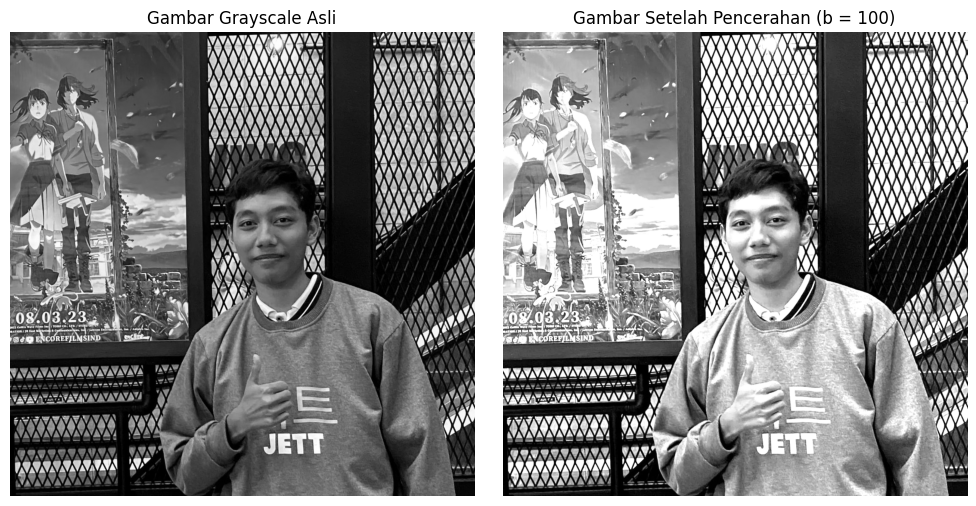

In [ ]:

b = 100  # Nilai pencerahan, bisa diganti sesuai kebutuhan
brightened_image = gray_image.astype(np.int16) + b

# Lakukan clipping agar nilai tetap di rentang [0, 255]
brightened_image = np.clip(brightened_image, 0, 255).astype(np.uint8)

# Visualisasi hasil
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title('Gambar Grayscale Asli')
axes[0].axis('off')

axes[1].imshow(brightened_image, cmap='gray')
axes[1].set_title(f'Gambar Setelah Pencerahan (b = {b})')
axes[1].axis('off')

plt.tight_layout()
plt.show()

**b. Berdasarkan geometri**  

Posisi pixel diubah ke posisi yang baru, sedangkan intensitasnya tidak berubah. Contoh operasi titik berdasarkan geometri misalnya pemutaran (rotasi), pergeseran (translasi), penskalaan (dilatasi) , pembetulan erotan (distorsi) geometri 

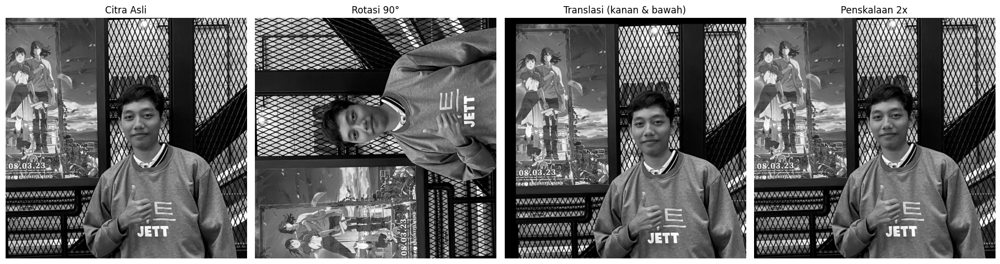

In [ ]:
# 1. Rotasi
angle = 90
h, w = gray_image.shape
center = (w // 2, h // 2)
rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated_image = cv2.warpAffine(gray_image, rot_matrix, (w, h))

# 2. Translasi (geser 50 piksel ke kanan dan 30 ke bawah)
tx, ty = 50, 30
trans_matrix = np.float32([[1, 0, tx], [0, 1, ty]])
translated_image = cv2.warpAffine(gray_image, trans_matrix, (w, h))

# 3. Penskalaan (resize 2x lebih besar)
scaled_image = cv2.resize(gray_image, (w*2, h*2), interpolation=cv2.INTER_LINEAR)

# Visualisasi hasil
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title('Citra Asli')
axes[0].axis('off')

axes[1].imshow(rotated_image, cmap='gray')
axes[1].set_title('Rotasi 90°')
axes[1].axis('off')

axes[2].imshow(translated_image, cmap='gray')
axes[2].set_title('Translasi (kanan & bawah)')
axes[2].axis('off')

axes[3].imshow(scaled_image, cmap='gray')
axes[3].set_title('Penskalaan 2x')
axes[3].axis('off')

plt.tight_layout()
plt.show()

**c. Gabungan intensitas dan geometri**

Operasi ini tidak hanya mengubah nilai intensitas pixel, tapi juga mengubah posisinya. Misalnya image morphing, yaitu perubahan bentuk objek beserta nilai intensitasnya 

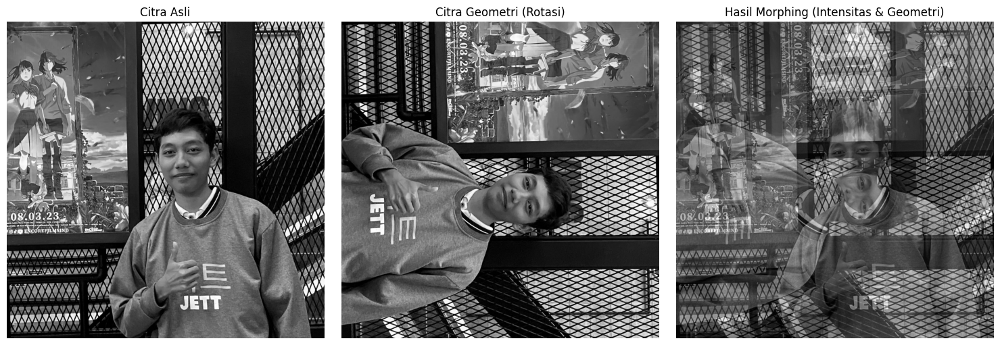

In [ ]:
img1 = cv2.imread('tuhu.jpg', 0)
img2 = cv2.rotate(img1, cv2.ROTATE_90_CLOCKWISE) 


h, w = img1.shape
img2 = cv2.resize(img2, (w, h))


alpha = 0.5 
morphed = cv2.addWeighted(img1, 1-alpha, img2, alpha, 0)

# Visualisasi hasil
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img1, cmap='gray')
axes[0].set_title('Citra Asli')
axes[0].axis('off')

axes[1].imshow(img2, cmap='gray')
axes[1].set_title('Citra Geometri (Rotasi)')
axes[1].axis('off')

axes[2].imshow(morphed, cmap='gray')
axes[2].set_title('Hasil Morphing (Intensitas & Geometri)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

**2. Aras Lokal**

Operasi pada aras lokal menghasilkan citra keluaran yang intensitas suatu pixel bergantung pada intensitas pixel-pixel tetangganya (neighborhood).

Secara matematis, operasi lokal dapat dinyatakan sebagai:
$$
f_B(x, y) = O_{lokal}\{f_A(N(x, y))\}
$$

Di mana:
- $f_A$ : citra masukan
- $f_B$ : citra keluaran
- $O_{lokal}$ : operasi lokal (misal: filter, konvolusi, dll)
- $N(x, y)$ : neighborhood, yaitu piksel-piksel di sekitar $(x, y)$

Contoh umum operasi lokal adalah filtering (misal: rata-rata, median, konvolusi kernel).

Contoh operasi beraras lokal adalah operasi konvolusi untuk mendeteksi tepi (edge detection) dan pelembutan citra (image smoothing)

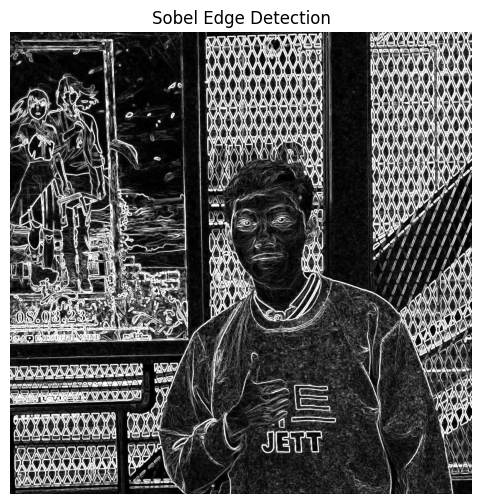

In [36]:
# Baca gambar grayscale
img = cv2.imread('tuhu.jpg', cv2.IMREAD_GRAYSCALE)

# Sobel filter X dan Y
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

# Hitung magnitudo gradien
gradient_magnitude = cv2.magnitude(sobelx, sobely)
gradient_magnitude = cv2.convertScaleAbs(gradient_magnitude)

# Tampilkan dengan plt
plt.figure(figsize=(6,6))
plt.imshow(gradient_magnitude, cmap='gray')
plt.title("Sobel Edge Detection")
plt.axis('off')
plt.show()

**3. Aras Global**

Operasi pada aras global menghasilkan citra keluaran yang
intensitas suatu pixel bergantung pada intensitas keseluruhan pixel. Contoh operasi beraras global adalah operasi penyetaraan
histogram untuk meningkatkan kualitas citra.

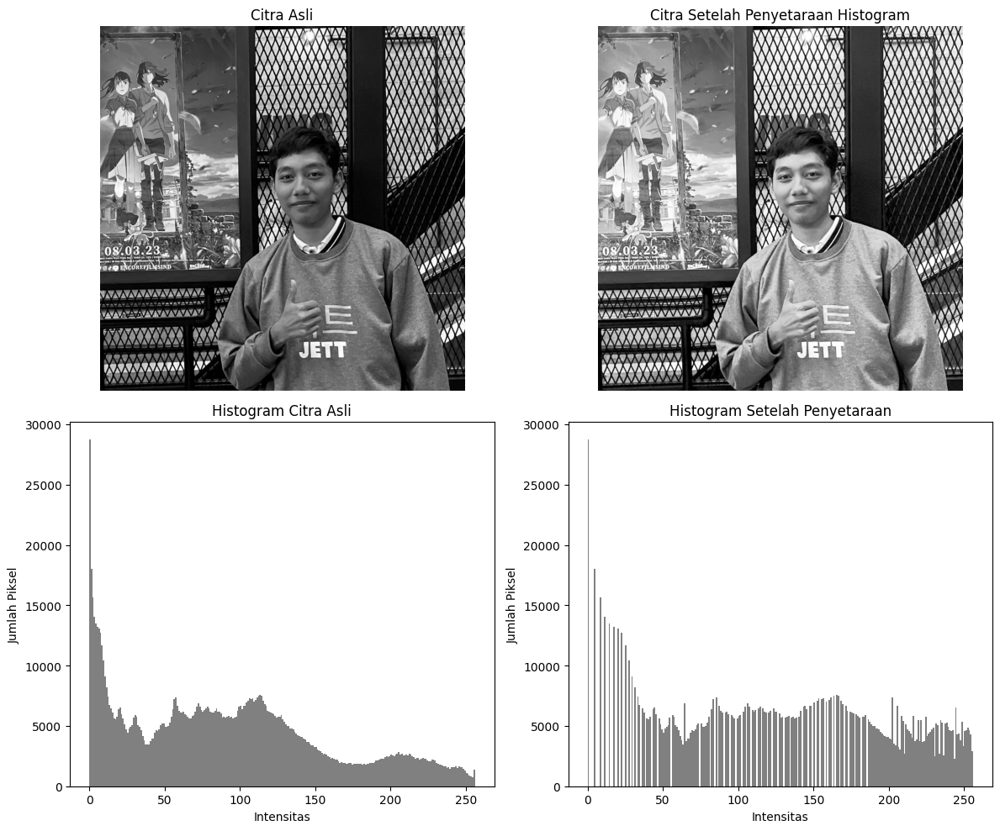

In [ ]:
# Baca gambar sebagai grayscale
image = cv2.imread('tuhu.jpg', 0)

# Penyetaraan histogram
equalized = cv2.equalizeHist(image)

# Visualisasi hasil dan histogram
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0,0].imshow(image, cmap='gray')
axes[0,0].set_title('Citra Asli')
axes[0,0].axis('off')
axes[0,1].imshow(equalized, cmap='gray')
axes[0,1].set_title('Citra Setelah Penyetaraan Histogram')
axes[0,1].axis('off')
axes[1,0].hist(image.ravel(), bins=256, range=[0,256], color='gray')
axes[1,0].set_title('Histogram Citra Asli')
axes[1,0].set_xlabel('Intensitas')
axes[1,0].set_ylabel('Jumlah Piksel')
axes[1,1].hist(equalized.ravel(), bins=256, range=[0,256], color='gray')
axes[1,1].set_title('Histogram Setelah Penyetaraan')
axes[1,1].set_xlabel('Intensitas')
axes[1,1].set_ylabel('Jumlah Piksel')
plt.tight_layout()
plt.show()

**4. Aras Objek**

Operasi jenis ini hanya dilakukan pada objek tertentu di
dalam citra. Tujuan dan operasi pada aras objek adalah untuk mengenali
objek tersebut, misalnya dengan menghitung rata-rata intensitas, ukuran,
bentuk, dan karakteristik lain dan objek. Operasi aras objek adalah
operasi yang sangat sulit, karena sebelumnya kita harus dapat
menjawab: apakah objek itu, bagaimana menemukannya?
Operasi Aritmetika
Karena citra digital adalah matriks, maka operasi-operasi
aritmetika matriks juga berlaku pada citra. Operasi matriks yang dapat
dilakukan adalah:

**1. Penjumlahan Dua Buah Citra**
    
Persamaannya:

$$ C(x,y)=A(x,y)+B(x,y) $$

C adalah citra baru yang intensitas setiap pixelnya adalah
jumlah dari intensitas tiap pixel pada A dan B. Jika hasil penjumlahan
intensitas lebih besar dari 255, maka intensitasnya dibulatkan ke 255.



Berikut adalah contoh program untuk menjumlahkan Dua buah citra: 

Error: Ukuran kedua citra harus sama untuk dapat dijumlahkan.
Mengubah ukuran citra B menjadi 1080x1080 piksel.


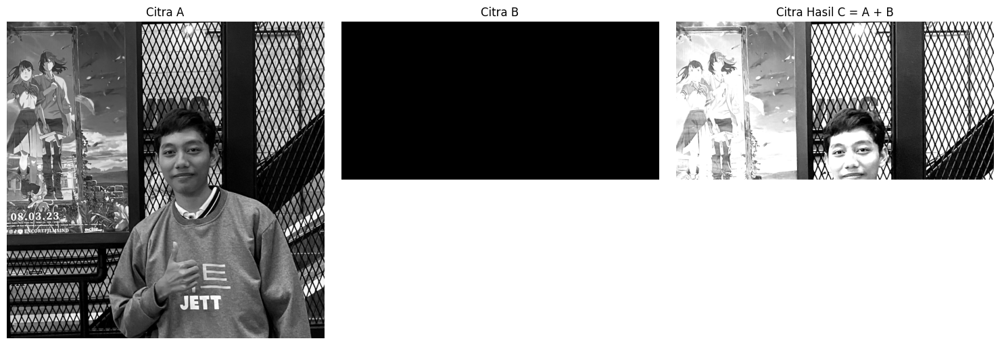

In [ ]:
def penjumlahan_citra(path_citra_A, path_citra_B):
    """
    Fungsi untuk menjumlahkan dua buah citra.

    Args:
        path_citra_A (str): Path ke file gambar pertama.
        path_citra_B (str): Path ke file gambar kedua.

    Returns:
        Tuple berisi citra A, citra B, dan citra hasil penjumlahan.
        Mengembalikan None jika gambar tidak ditemukan atau ukurannya berbeda.
    """

    citra_A = cv2.imread(path_citra_A, cv2.IMREAD_GRAYSCALE)
    citra_B = cv2.imread(path_citra_B, cv2.IMREAD_GRAYSCALE)

    if citra_A is None or citra_B is None:
        print("Error: Salah satu atau kedua path citra tidak valid.")
        return None

    if citra_A.shape != citra_B.shape:
        print("Error: Ukuran kedua citra harus sama untuk dapat dijumlahkan.")
        print(f"Mengubah ukuran citra B menjadi {citra_A.shape[1]}x{citra_A.shape[0]} piksel.")
        citra_B = cv2.resize(citra_B, (citra_A.shape[1], citra_A.shape[0]))

    citra_C_temp = citra_A.astype(np.int16) + citra_B.astype(np.int16)

    citra_C = np.clip(citra_C_temp, 0, 255).astype(np.uint8)
    
    return citra_A, citra_B, citra_C

def buat_gambar_dummy(nama_file, width=300, height=300, warna=100):
    gambar = np.full((height, width), warna, dtype=np.uint8)
    cv2.imwrite(nama_file, gambar)

buat_gambar_dummy('gambar1.jpg', warna=150)
buat_gambar_dummy('gambar2.jpg', warna=150)


path1 = 'tuhu.jpg'
path2 = 'indonesia.png'

hasil = penjumlahan_citra(path1, path2)

if hasil:
    citra_A, citra_B, citra_C = hasil

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(citra_A, cmap='gray')
    plt.title('Citra A')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(citra_B, cmap='gray')
    plt.title('Citra B')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(citra_C, cmap='gray')
    plt.title('Citra Hasil C = A + B')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

**2. Pengurangan Dua Buah Citra**
    
Persamaannya:

$$ C(x, y) = A(x, y) - B(x, y) $$

C adalah citra baru yang intensitas setiap pixelnya adalah
selisih antara intensitas pixel pada A dan B.

Ada kemungkinan hasil operasi ini menghasilkan nilai
negatif, oleh karena itu, operasi pengurangan citra perlu melibatkan
operasi clipping.

Berikut adalah contoh program pengurangan citra: 

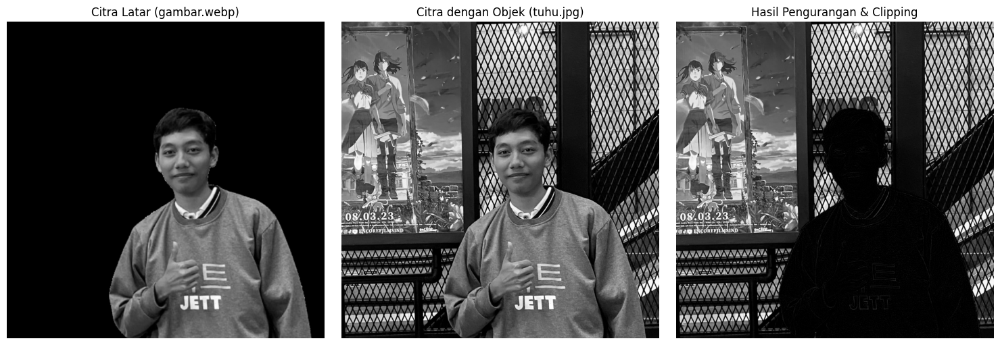

In [ ]:

background = cv2.imread('tuhuNbg.png', 0) 
foreground = cv2.imread('tuhu.jpg', 0)    

if background is None or foreground is None:
    print('Error: Salah satu gambar tidak ditemukan atau path salah.')
elif background.shape != foreground.shape:
    background = cv2.resize(background, (foreground.shape[1], foreground.shape[0]))


subtracted = cv2.subtract(foreground, background)  

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(background, cmap='gray')
axes[0].set_title('Citra Latar (gambar.webp)')
axes[0].axis('off')
axes[1].imshow(foreground, cmap='gray')
axes[1].set_title('Citra dengan Objek (tuhu.jpg)')
axes[1].axis('off')
axes[2].imshow(subtracted, cmap='gray')
axes[2].set_title('Hasil Pengurangan & Clipping')
axes[2].axis('off')
plt.tight_layout()
plt.show()

**3. Perkalian Citra**
  
Persamaannya:

$$ C(x, y) =A(x, y) B(x, y) $$

Perkalian citra sering digunakan untuk mengoreksi kenirlanj
aran sensor dengan cara mengalikan matriks citra dengan matrik
koreksi. Jadi, dalam hal ini A adalah citra sedangkan B adalah matriks
koreksi. Hasil operasi mungkin bernilai riil, karena itu semua nilai
dibulatkan ke nilai bulat terdekat, nilai maksimum adalah 255.

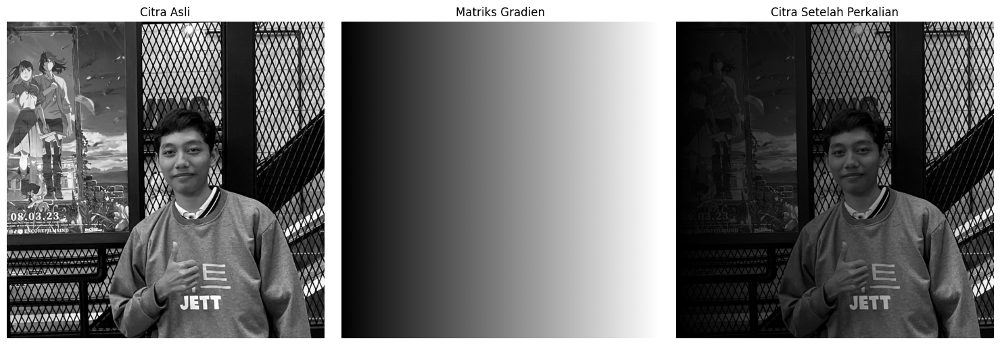

In [ ]:
# Membaca gambar dalam mode grayscale
img_gray = cv2.imread('tuhu.jpg', cv2.IMREAD_GRAYSCALE)

if img_gray is None:
    print("Gagal: file gambar tidak ditemukan atau path salah.")
else:
    tinggi, lebar = img_gray.shape

    gradien = np.linspace(0, 1, lebar)
    gradien_matrix = np.tile(gradien, (tinggi, 1))

    hasil_perkalian = img_gray.astype(np.float32) * gradien_matrix

    hasil_fix = np.clip(np.rint(hasil_perkalian), 0, 255).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img_gray, cmap='gray')
    axes[0].set_title('Citra Asli')
    axes[0].axis('off')

    axes[1].imshow(gradien_matrix, cmap='gray')
    axes[1].set_title('Matriks Gradien')
    axes[1].axis('off')

    axes[2].imshow(hasil_fix, cmap='gray')
    axes[2].set_title('Citra Setelah Perkalian')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()


**4. Penjumlahan / pengurangan citra dengan skalar**  
  
Persamaannya:

$$ B(x, y) =A(x, y)± c $$


Penjumlahan citra A dengan skalar c adalah menambah setiap
pixel di dalam citra ah sebuah skalar c, dan menghasilkan citra baru B
yang intensitasnya lebih terang daripada A. Kenaikan intensitas sama
untuk seluruh pixel, yaitu c.

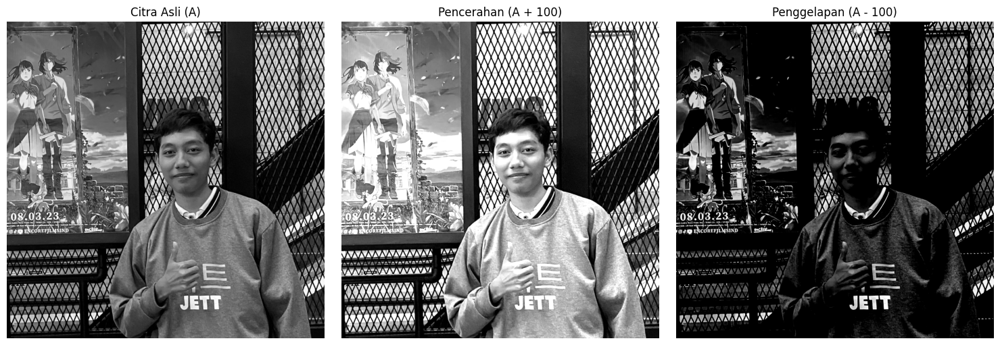

In [52]:
# Baca citra grayscale sebagai A
image_A = cv2.imread('tuhu.jpg', 0)
if image_A is None:
    print('Error: Gambar tidak ditemukan atau path salah.')
else:
    # Penjumlahan citra dengan skalar c (pencerahan)
    c = 100  # skalar pencerahan
    brightened = image_A.astype(np.int16) + c
    brightened_clipped = np.clip(brightened, 0, 255).astype(np.uint8)

    # Pengurangan citra dengan skalar c (penggelapan)
    c_dark = 100  # skalar penggelapan
    darkened = image_A.astype(np.int16) - c_dark
    darkened_clipped = np.clip(darkened, 0, 255).astype(np.uint8)

    # Visualisasi hasil
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image_A, cmap='gray')
    axes[0].set_title('Citra Asli (A)')
    axes[0].axis('off')
    axes[1].imshow(brightened_clipped, cmap='gray')
    axes[1].set_title(f'Pencerahan (A + {c})')
    axes[1].axis('off')
    axes[2].imshow(darkened_clipped, cmap='gray')
    axes[2].set_title(f'Penggelapan (A - {c_dark})')
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

**5. Perkalian / pembagian Citra dengan Skalar**  
  
Persamaannya:

$$B(x, y)= c . A(x,y), dan B(x,y)=A(x, y)/c $$

Pembagian citra A dengan skalar c menghasilkan citra baru B
yang intensitasnya lebih gelap daripada A. Penurunan intensitas setiap
pixel berbanding terbalik dengan c. Operasi pembagian citra dengan
skalar dipakai untuk normalisasi kecerahan (normalization of
brightness).

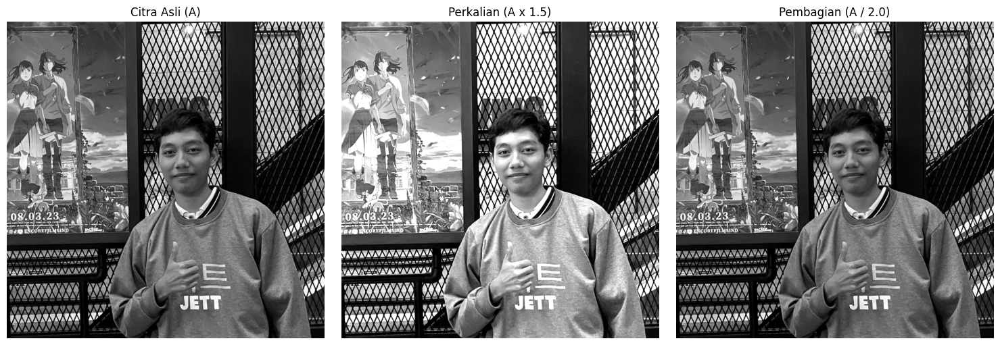

In [ ]:
# Baca citra grayscale sebagai A
image_A = cv2.imread('tuhu.jpg', 0)
if image_A is None:
    print('Error: Gambar tidak ditemukan atau path salah.')
else:
    # Perkalian citra dengan skalar c (pencerahan)
    c_mult = 1.5  # skalar pencerahan (misal: 1.5 kali lebih terang)
    multiplied = image_A.astype(np.float32) * c_mult
    multiplied_clipped = np.clip(np.round(multiplied), 0, 255).astype(np.uint8)

    # Pembagian citra dengan skalar c (penggelapan/normalisasi)
    c_div = 2.0  # skalar penggelapan (misal: 2 kali lebih gelap)
    divided = image_A.astype(np.float32) / c_div
    divided_clipped = np.clip(np.round(divided), 0, 255).astype(np.uint8)

    # Visualisasi hasil
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image_A, cmap='gray')
    axes[0].set_title('Citra Asli (A)')
    axes[0].axis('off')
    axes[1].imshow(multiplied_clipped, cmap='gray')
    axes[1].set_title(f'Perkalian (A x {c_mult})')
    axes[1].axis('off')
    axes[2].imshow(divided_clipped, cmap='gray')
    axes[2].set_title(f'Pembagian (A / {c_div})')
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

# Operasi Boolean pada Citra

Selain operasi aritmetika, pemrosesan citra digital juga
melibatkan operasi Boolean (and, or, dan not):

$$
C(x,y) = A(x,y) \land B(x,y)
$$

$$
C(x,y) = A(x,y) \lor B(x,y)
$$

$$
C(x,y) = \lnot A(x,y)
$$

Berikut adalah contoh code untuk operasi **NOT**

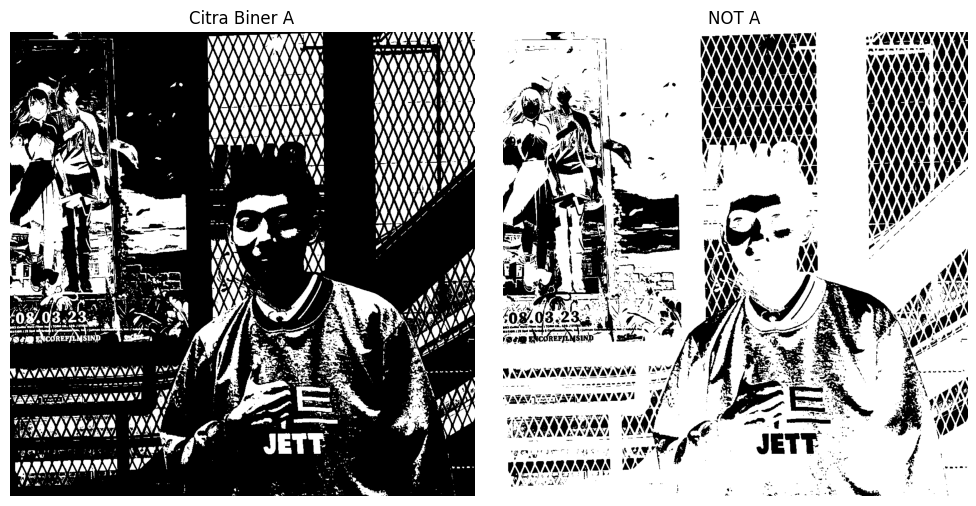

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Baca satu citra grayscale
image_A = cv2.imread('tuhu.jpg', 0)
if image_A is None:
    print('Error: Gambar tidak ditemukan atau path salah.')
else:
    # Threshold agar jadi gambar biner (hitam-putih)
    _, bin_A = cv2.threshold(image_A, 128, 255, cv2.THRESH_BINARY)

    # Operasi Boolean NOT pada citra biner A
    not_result = cv2.bitwise_not(bin_A)

    # Visualisasi hasil
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(bin_A, cmap='gray')
    axes[0].set_title('Citra Biner A')
    axes[0].axis('off')
    axes[1].imshow(not_result, cmap='gray')
    axes[1].set_title('NOT A')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

# Operasi Geometri pada Citra

Pada operasi geometrik, koordinat pixel berubah akibat
transformasi, sedangkan intensitasnya tetap. mi berbeda dengan dengan
operasi aritmetika yang mana koordinat pixel tetap sedangkan
intensitasnya berubah.

**a. Translasi**  
  
Rumus translasi citra:

$ x’=x+m $  
$ y’=y+n $

yang dalam hal mi, m adalah besar pergeseran dalam arah x, sedangkan
n adalah besar pergeseran dalam arah y. Jika citra semula adalah A dan
citra hasil translasi adalab B, maka translasi dapat diimplementasikan
dengan menyalin citra dan A ke B:  
  
$ B[x][y] =A[x+m][y+n] $

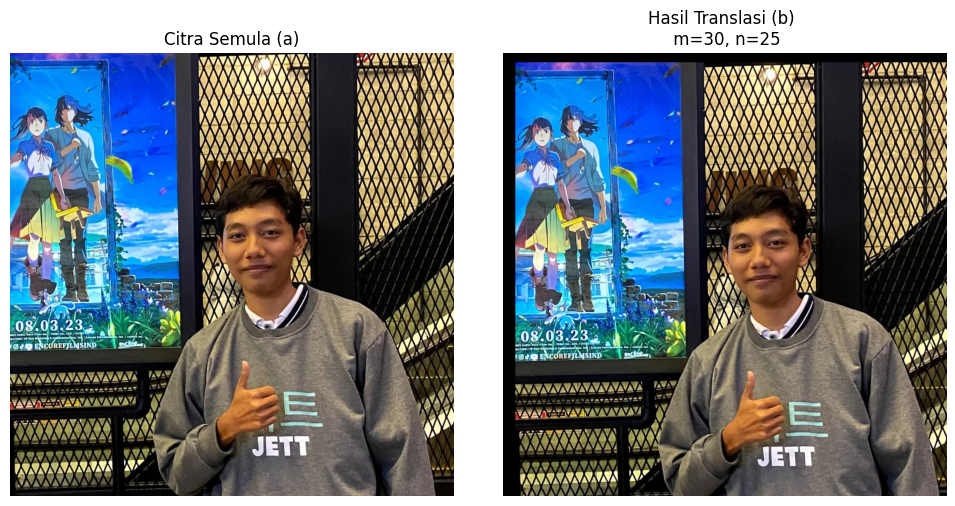

In [ ]:
# --- 1. Muat Citra Anda ---
# GANTI "nama_gambar_anda.jpg" DENGAN NAMA FILE GAMBAR ANDA
file_gambar = "tuhu.jpg"
image = cv2.imread(file_gambar)

# Periksa apakah gambar berhasil dimuat
if image is None:
    print(f"Error: Tidak dapat menemukan atau membuka file gambar di '{file_gambar}'")
    print("Pastikan nama file sudah benar dan file tersebut berada di folder yang sama dengan script ini.")
else:
    # --- 2. Tentukan Parameter Translasi ---
    m = 30  # Pergeseran horizontal (ke kanan)
    n = 25  # Pergeseran vertikal (ke bawah)

    # Dapatkan dimensi citra (tinggi, lebar)
    rows, cols = image.shape[:2]

    # --- 3. Buat Matriks Transformasi ---
    M = np.float32([[1, 0, m],
                    [0, 1, n]])

    # --- 4. Terapkan Translasi ---
    translated_image = cv2.warpAffine(image, M, (cols, rows))

    # --- 5. Tampilkan Hasil ---
    # Konversi BGR (OpenCV) ke RGB (Matplotlib) untuk tampilan warna yang benar
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    translated_image_rgb = cv2.cvtColor(translated_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 5))

    # Citra Asli
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Citra Semula (a)')
    plt.axis('off') # Sembunyikan sumbu

    # Citra Hasil Translasi
    plt.subplot(1, 2, 2)
    plt.imshow(translated_image_rgb)
    plt.title(f'Hasil Translasi (b) \n m={m}, n={n}')
    plt.axis('off') # Sembunyikan sumbu

    plt.tight_layout()
    plt.show()

**b. Rotasi**  
  
Rumus rotasi citra :

$x’ = x cos (θ) – y sin (θ)$  
$y’ = x sin (θ) + y cos (θ)$

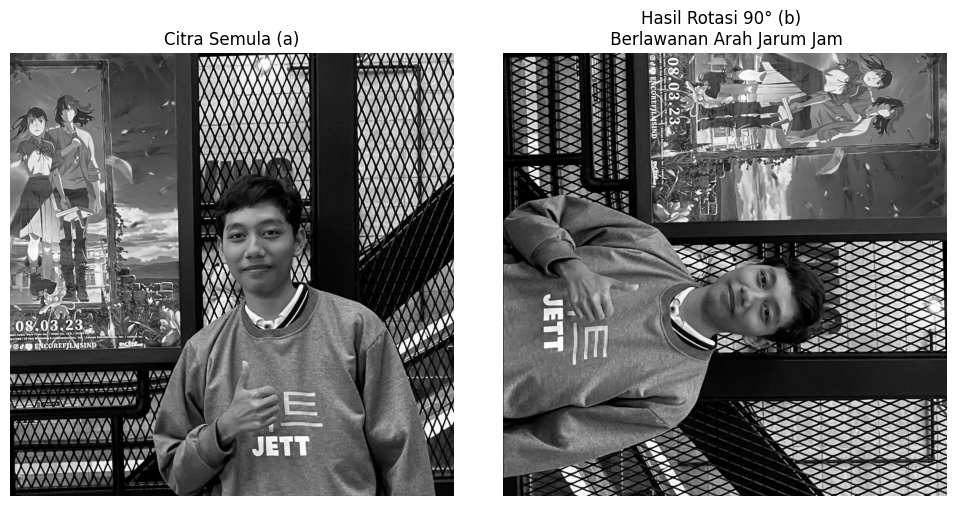

In [ ]:
# --- 1. Muat Citra Asli ---
# GANTI "nama_gambar_anda.jpg" DENGAN NAMA FILE GAMBAR ANDA
# Pastikan file gambar Anda ada di folder yang sama dengan script ini.
file_gambar = "tuhu.jpg"
image = cv2.imread(file_gambar, cv2.IMREAD_GRAYSCALE) # Memuat sebagai grayscale untuk kemudahan

# Periksa apakah gambar berhasil dimuat
if image is None:
    print(f"Error: Tidak dapat menemukan atau membuka file gambar di '{file_gambar}'")
    print("Pastikan nama file sudah benar dan file tersebut berada di folder yang sama dengan script ini.")
    exit() # Keluar jika gambar tidak ditemukan

# --- 2. Tentukan Sudut Rotasi ---
# Sudut rotasi dalam derajat.
# Positif untuk rotasi berlawanan arah jarum jam (sesuai rumus Anda)
# Untuk contoh 90 derajat berlawanan arah jarum jam:
angle_degrees = 90
angle_radians = np.radians(angle_degrees) # Konversi ke radian

# --- 3. Dapatkan Dimensi Citra dan Titik Pusat Rotasi ---
rows, cols = image.shape[:2]
# Titik pusat rotasi (biasanya di tengah gambar)
center_x, center_y = cols / 2, rows / 2

# Mari kita hitung komponen-komponennya
cos_theta = np.cos(angle_radians)
sin_theta = np.sin(angle_radians)

# Matriks rotasi 2x3
M = np.float32([
    [cos_theta, -sin_theta, center_x * (1 - cos_theta) + center_y * sin_theta],
    [sin_theta,  cos_theta, center_y * (1 - cos_theta) - center_x * sin_theta]
])

abs_cos = abs(cos_theta)
abs_sin = abs(sin_theta)
new_cols = int(rows * abs_sin + cols * abs_cos)
new_rows = int(rows * abs_cos + cols * abs_sin)


M[0, 2] += (new_cols / 2) - center_x
M[1, 2] += (new_rows / 2) - center_y

rotated_image = cv2.warpAffine(image, M, (new_cols, new_rows))


plt.figure(figsize=(10, 5))

# Citra Asli
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Citra Semula (a)')
plt.axis('off')

# Citra Hasil Rotasi
plt.subplot(1, 2, 2)
plt.imshow(rotated_image, cmap='gray')
plt.title(f'Hasil Rotasi {angle_degrees}° (b) \n Berlawanan Arah Jarum Jam')
plt.axis('off')

plt.tight_layout()
plt.show()

**c. Penskalaan Citra**  
  
Penskalaan citra, disebut juga image zooming, yaitu
pengubahan ukuran citra (membesar/zoom out atau mengecillzoom in).
Rumus penskalaan citra:  
$x’ = sx . x$   
$y’ = sy . y$  
yang dalam hal ini, sx dan sy, adalah faktor skala masing-masing dalam
arah x dan arah y.

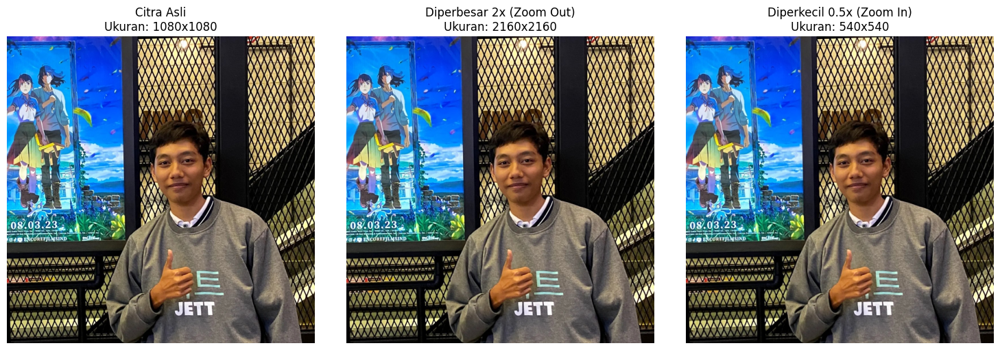

In [ ]:
# --- 1. Muat Citra Asli ---
# GANTI "nama_gambar_anda.jpg" DENGAN NAMA FILE GAMBAR ANDA
# Pastikan file gambar Anda ada di folder yang sama dengan script ini.
file_gambar = "tuhu.jpg"
image = cv2.imread(file_gambar)

# Periksa apakah gambar berhasil dimuat
if image is None:
    print(f"Error: Tidak dapat menemukan atau membuka file gambar di '{file_gambar}'")
    print("Pastikan nama file sudah benar dan file tersebut berada di folder yang sama dengan script ini.")
else:
    # --- 2. Memperbesar Citra (Zoom Out menurut teks Anda) ---
    # Faktor skala sesuai contoh: sx = 2, sy = 2
    scale_x_enlarge = 2
    scale_y_enlarge = 2
    
    # Menggunakan interpolasi INTER_NEAREST untuk meniru "menyalin setiap pixel"
    # Ini akan menghasilkan efek blocky/kotak-kotak seperti pada teori.
    enlarged_image = cv2.resize(image, None, fx=scale_x_enlarge, fy=scale_y_enlarge, interpolation=cv2.INTER_NEAREST)

    # --- 3. Memperkecil Citra (Zoom In menurut teks Anda) ---
    # Faktor skala sesuai contoh: sx = 1/2, sy = 1/2
    scale_x_shrink = 0.5
    scale_y_shrink = 0.5
    
    # Menggunakan interpolasi INTER_AREA yang ideal untuk memperkecil citra.
    # Cara kerjanya mirip dengan "mengambil rata-rata dari 4 pixel" untuk mencegah distorsi.
    shrunken_image = cv2.resize(image, None, fx=scale_x_shrink, fy=scale_y_shrink, interpolation=cv2.INTER_AREA)

    # --- 4. Tampilkan Hasil ---
    # Konversi BGR (OpenCV) ke RGB (Matplotlib) untuk tampilan warna yang benar
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    enlarged_image_rgb = cv2.cvtColor(enlarged_image, cv2.COLOR_BGR2RGB)
    shrunken_image_rgb = cv2.cvtColor(shrunken_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 5))

    # Citra Asli
    plt.subplot(1, 3, 1)
    plt.imshow(image_rgb)
    plt.title(f'Citra Asli\nUkuran: {image.shape[1]}x{image.shape[0]}')
    plt.axis('off')

    # Citra Diperbesar (Zoom Out)
    plt.subplot(1, 3, 2)
    plt.imshow(enlarged_image_rgb)
    plt.title(f'Diperbesar 2x (Zoom Out)\nUkuran: {enlarged_image.shape[1]}x{enlarged_image.shape[0]}')
    plt.axis('off')

    # Citra Diperkecil (Zoom In)
    plt.subplot(1, 3, 3)
    plt.imshow(shrunken_image_rgb)
    plt.title(f'Diperkecil 0.5x (Zoom In)\nUkuran: {shrunken_image.shape[1]}x{shrunken_image.shape[0]}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

**d. Flipping**  
Flipping adalah operasi geometri yang sama dengan pencerminan
(image reflection). Ada dua macam flipping: horizontal dan vertikal.

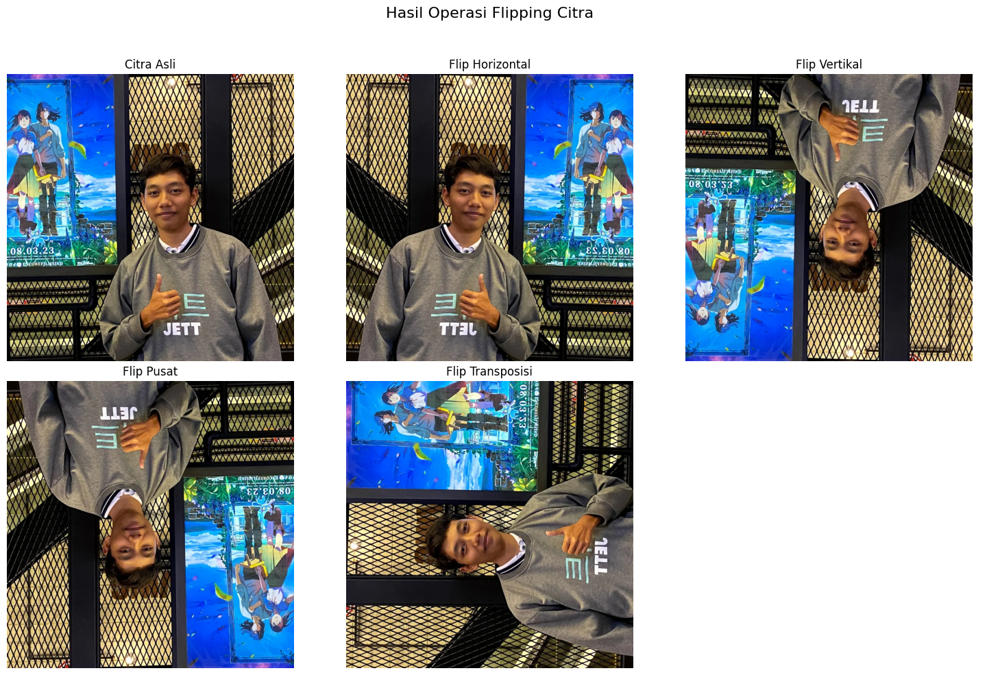

In [56]:
# === 1. Membaca file citra ===
nama_file = "tuhu.jpg"
citra = cv2.imread(nama_file)

# Cek apakah gambar berhasil dimuat
if citra is None:
    print(f"Gambar '{nama_file}' tidak ditemukan. Pastikan file tersedia di direktori yang benar.")
else:
    # === 2. Proses flipping citra ===

    # Flip ke kanan–kiri (cermin terhadap sumbu vertikal)
    flip_hor = cv2.flip(citra, 1)

    # Flip atas–bawah (cermin terhadap sumbu horizontal)
    flip_ver = cv2.flip(citra, 0)

    # Flip ke arah titik pusat (gabungan horizontal dan vertikal)
    flip_both = cv2.flip(citra, -1)

    # Transposisi (flip terhadap garis diagonal utama, x = y)
    flip_transpose = cv2.transpose(citra)

    # === 3. Konversi BGR ke RGB untuk ditampilkan dengan matplotlib ===
    citra_rgb = cv2.cvtColor(citra, cv2.COLOR_BGR2RGB)
    hor_rgb = cv2.cvtColor(flip_hor, cv2.COLOR_BGR2RGB)
    ver_rgb = cv2.cvtColor(flip_ver, cv2.COLOR_BGR2RGB)
    both_rgb = cv2.cvtColor(flip_both, cv2.COLOR_BGR2RGB)
    trans_rgb = cv2.cvtColor(flip_transpose, cv2.COLOR_BGR2RGB)

    # === 4. Visualisasi hasil ===
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle("Hasil Operasi Flipping Citra", fontsize=16)

    daftar_gambar = [
        (citra_rgb, "Citra Asli"),
        (hor_rgb, "Flip Horizontal"),
        (ver_rgb, "Flip Vertikal"),
        (both_rgb, "Flip Pusat"),
        (trans_rgb, "Flip Transposisi"),
    ]

    for ax, (img, judul) in zip(axes.ravel(), daftar_gambar):
        ax.imshow(img)
        ax.set_title(judul)
        ax.axis("off")

    # Kosongkan subplot terakhir jika tidak terpakai
    axes[1, 2].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
